In [251]:
import pandas as pd 
import numpy as np
from matplotlib import pyplot as plt
from sklearn.linear_model import Lasso ,Ridge
from sklearn.model_selection import  cross_val_score

# Data Load

In [244]:
origin_train = pd.read_csv("train.csv")
origin_test = pd.read_csv('test.csv')
print(list(origin_train.columns))

['date_time', 'deg_C', 'relative_humidity', 'absolute_humidity', 'sensor_1', 'sensor_2', 'sensor_3', 'sensor_4', 'sensor_5', 'target_carbon_monoxide', 'target_benzene', 'target_nitrogen_oxides']


#function

In [490]:
def show_corr(df):
    corr_matrix = df.corr()[['target_carbon_monoxide','target_benzene','target_nitrogen_oxides']].T
    corr_matrix = corr_matrix.drop(columns =['target_carbon_monoxide','target_benzene','target_nitrogen_oxides'],axis = 1 )
    plt.matshow(np.array(corr_matrix))
    plt.colorbar()
    plt.show()
    print(corr_matrix)

def df_to_x_y(df):
    train_y = df[['target_carbon_monoxide','target_benzene','target_nitrogen_oxides']]
    train_x = df.drop(columns= ['target_carbon_monoxide','target_benzene','target_nitrogen_oxides'],axis = 1)
    return train_x,train_y

def model_fit_kfold (model_choise,train_x , train_y, cv = 10):
    train_y = train_y
    y_train_carbon_monoxide = train_y['target_carbon_monoxide']    
    y_train_target_benzene = train_y['target_benzene']    
    y_train_target_nitrogen_oxides = train_y['target_nitrogen_oxides']  

    model   = Lasso()
    model_c = Lasso()
    model_t = Lasso()
    model_n = Lasso()

    model.fit(train_x,train_y)
    model_c.fit(train_x,y_train_carbon_monoxide)
    model_t.fit(train_x,y_train_target_benzene)
    model_n.fit(train_x,y_train_target_nitrogen_oxides)
    
    model_scores = cross_val_score(model, train_x, train_y, cv = cv).mean()
    model_c_scores = cross_val_score(model_c, train_x, y_train_carbon_monoxide, cv = cv).mean()
    model_t_scores = cross_val_score(model_t, train_x, y_train_target_benzene, cv = cv).mean()
    model_n_scores = cross_val_score(model_n, train_x, y_train_target_nitrogen_oxides, cv = cv).mean()

    print(f'all:{model_scores}')
    print(f'y_train_carbon_monoxide:{model_c_scores}')
    print(f'y_train_target_benzene:{model_t_scores}')
    print(f'y_train_target_nitrogen_oxides:{model_n_scores}')

# none try

In [495]:
none_train = origin_train.copy()

x_train,y_train = df_to_x_y(none_train.drop(['date_time'],axis = 1))
model_fit_kfold(Lasso(),x_train,y_train)

all:0.5994199913200909
y_train_carbon_monoxide:0.7984764504050681
y_train_target_benzene:0.9428901742738253
y_train_target_nitrogen_oxides:0.0568933492813797


# Feature Analysis

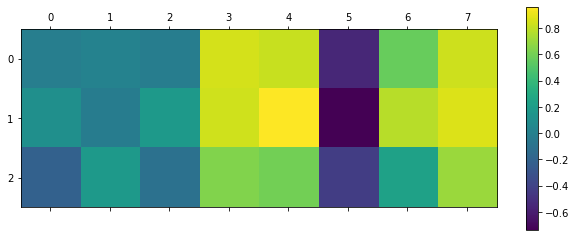

                           deg_C  relative_humidity  absolute_humidity  \
target_carbon_monoxide -0.007503           0.016589          -0.013756   
target_benzene          0.109757          -0.022895           0.186293   
target_nitrogen_oxides -0.205984           0.178608          -0.101911   

                        sensor_1  sensor_2  sensor_3  sensor_4  sensor_5  
target_carbon_monoxide  0.857215  0.821025 -0.547567  0.571412  0.834501  
target_benzene          0.842534  0.964440 -0.735545  0.783750  0.877662  
target_nitrogen_oxides  0.643044  0.604795 -0.427622  0.235662  0.708270  


In [501]:
show_corr(none_train)

In [289]:
df = origin_train.copy()

## datetime to hour_int

In [290]:
df['hour'] = pd.to_datetime(df['date_time']).dt.hour
try:
    df = df.drop(['date_time'],axis = 1)
except:
    None

In [ ]:
show_corr(none)

In [499]:
df['new_sum'] = (df['sensor_1'] + df['sensor_2'] + df['sensor_5'])/3

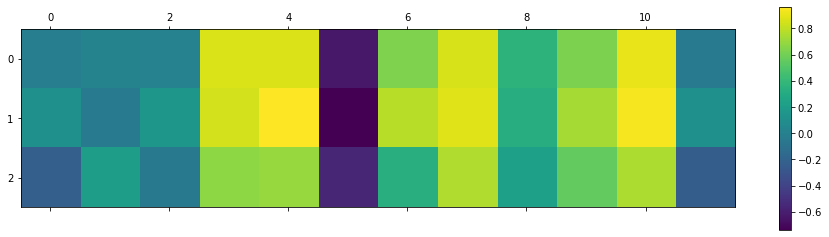

                           deg_C  relative_humidity  absolute_humidity  \
target_carbon_monoxide -0.011569           0.027888           0.016066   
target_benzene          0.118863          -0.035544           0.162703   
target_nitrogen_oxides -0.223621           0.209235          -0.045943   

                        sensor_1  sensor_2  sensor_3  sensor_4  sensor_5  \
target_carbon_monoxide  0.872176  0.878416 -0.627731  0.639056  0.860722   
target_benzene          0.850817  0.965505 -0.736821  0.784127  0.879150   
target_nitrogen_oxides  0.673895  0.700128 -0.556498  0.330509  0.761165   

                            hour     new_3   new_sum  mean_deg_c  
target_carbon_monoxide  0.362674  0.627731  0.912229   -0.030231  
target_benzene          0.326887  0.736821  0.943892    0.114703  
target_nitrogen_oxides  0.226063  0.556498  0.755762   -0.235486  


In [454]:

df = df.drop(df.index[[i for i in range(6675,6775)]],axis = 0)

gap = 1
mean_deg_c = new_result.copy()
for i in range(1,len(mean_deg_c)-1):
    #increase too much
    if mean_deg_c[i-1] - mean_deg_c[i] >  gap:
        mean_deg_c[i] = mean_deg_c[i-1] - gap
        change +=1
    #decrease too much    
    if mean_deg_c[i-1] - mean_deg_c[i] <  gap*-1:
        mean_deg_c[i] = mean_deg_c[i-1] + gap
        change +=1
plt.figure(figsize=(30,10))
plt.plot(new_result,marker = '.')
plt.plot(mean_deg_c,marker = '.')
plt.show()

3167


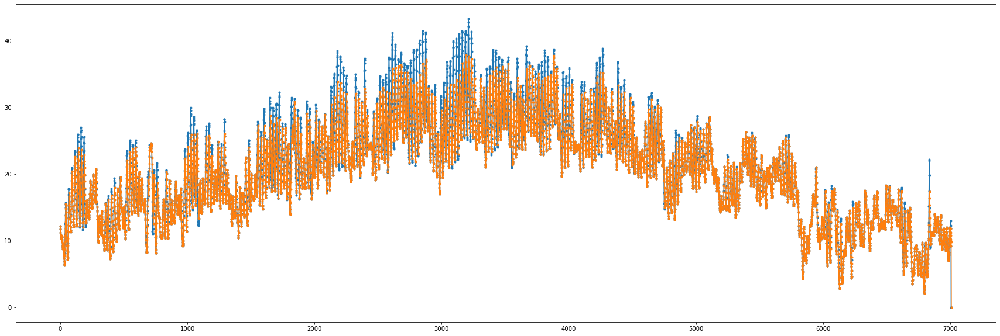

In [456]:
df['mean_deg_c'] = mean_deg_c

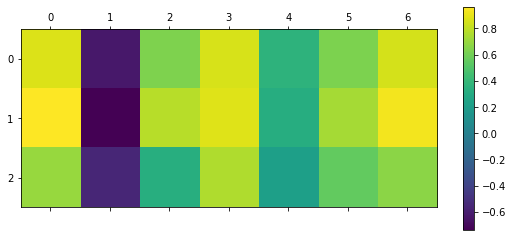

                        sensor_2  sensor_3  sensor_4  sensor_5      hour  \
target_carbon_monoxide  0.878416 -0.627731  0.639056  0.860722  0.362674   
target_benzene          0.965505 -0.736821  0.784127  0.879150  0.326887   
target_nitrogen_oxides  0.700128 -0.556498  0.330509  0.761165  0.226063   

                           new_3   new_sum  
target_carbon_monoxide  0.627731  0.858178  
target_benzene          0.736821  0.937646  
target_nitrogen_oxides  0.556498  0.669287  


In [470]:
show_corr(df[list(df.columns)[4:-1]])

In [464]:
train_x , train_y = df_to_x_y(df)

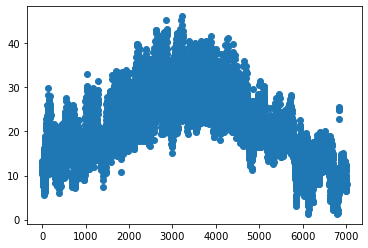

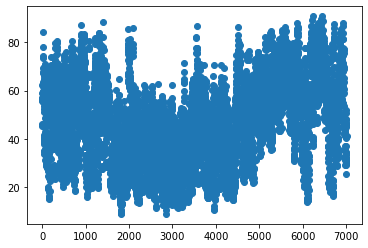

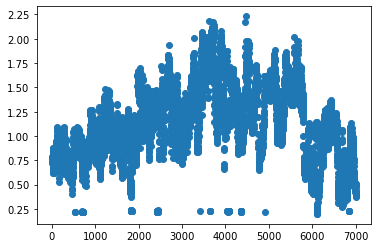

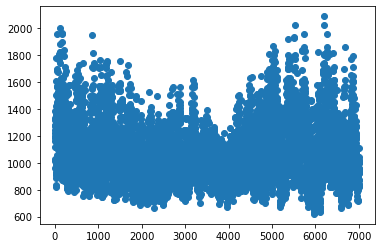

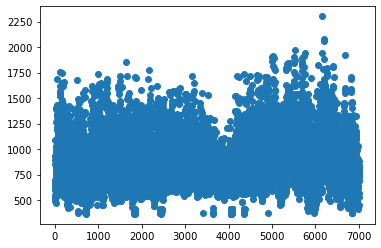

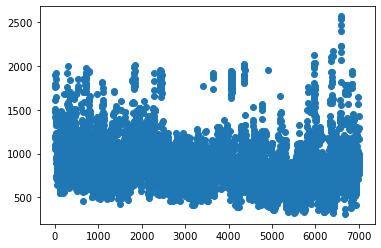

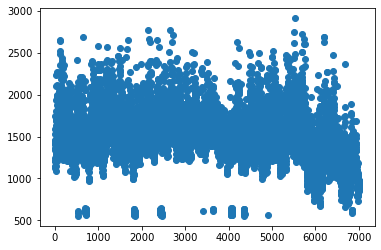

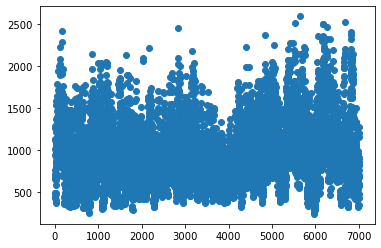

In [465]:
plt.scatter(list(range(len(train_x))),train_x['deg_C'])
plt.show()
plt.scatter(list(range(len(train_x))),train_x['relative_humidity'])
plt.show()
plt.scatter(list(range(len(train_x))),train_x['absolute_humidity'])
plt.show()
plt.scatter(list(range(len(train_x))),train_x['sensor_1'])
plt.show()
plt.scatter(list(range(len(train_x))),train_x['sensor_2'])
plt.show()
plt.scatter(list(range(len(train_x))),train_x['sensor_3'])
plt.show()
plt.scatter(list(range(len(train_x))),train_x['sensor_4'])
plt.show()
plt.scatter(list(range(len(train_x))),train_x['sensor_5'])
plt.show()

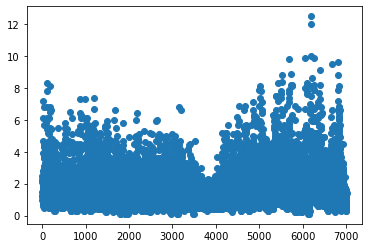

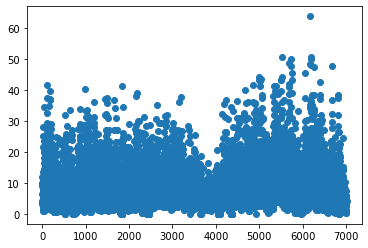

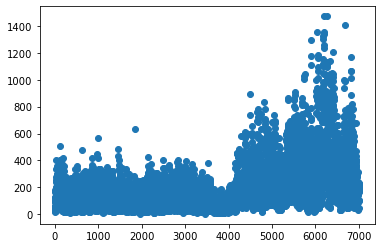

In [467]:
plt.scatter(list(range(len(train_x))),train_y['target_carbon_monoxide'])
plt.show()
plt.scatter(list(range(len(train_x))),train_y['target_benzene'])
plt.show()
plt.scatter(list(range(len(train_x))),train_y['target_nitrogen_oxides'])
plt.show()

In [276]:
x_train,y_train = df_to_x_y(df)
model_fit_kfold(Lasso(),x_train,y_train)